In [0]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

# Configure visualisations
%matplotlib inline
plt.style.use('ggplot')

# Configure seaborn
sns.set_style('white')

import warnings 
warnings.filterwarnings('ignore')

In [0]:
folder_path = '/content/drive/My Drive/IEEE-CIS Fraud Detection/'
train_identity = pd.read_csv(f'{folder_path}train_identity.csv')
train_transaction = pd.read_csv(f'{folder_path}train_transaction.csv')
test_identity = pd.read_csv(f'{folder_path}test_identity.csv')
test_transaction = pd.read_csv(f'{folder_path}test_transaction.csv')

In [0]:
# Let's combine the data and work with the whole dataset
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')

In [0]:
# Text Annotation
def text_annotate(cnt):
    for i in cnt.patches:
        height = i.get_height()
        cnt.text(i.get_x() + i.get_width()/2., height,'%d' % int(height),ha='center',va='bottom')
        
#-------------------------------------------------------------------------------

def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw={}, cbarlabel="", **kwargs):
    
    if not ax:
        ax = plt.gca()

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels)
    ax.set_yticklabels(row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    for edge, spine in ax.spines.items():
        spine.set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=["black", "white"],
                     threshold=None, **textkw):
   
    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

#------------------------------------------------------------------------------------------------------------------------------

def describe(datatrain,datatest,feature):
    d = pd.DataFrame(columns=[feature,'Train','TrainFraud','TrainNoFraud','Test'])
    d[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','NaNshare']
    for i in range(0,8):
        d['Train'].iloc[i] = datatrain[feature].describe().iloc[i]
        d['TrainFraud'].iloc[i]=datatrain[datatrain['isFraud']==1][feature].describe().iloc[i]
        d['TrainNoFraud'].iloc[i]=datatrain[datatrain['isFraud']==0][feature].describe().iloc[i]
        d['Test'].iloc[i]=datatest[feature].describe().iloc[i]
    d['Train'].iloc[8] = len(datatrain[feature].unique())
    d['TrainFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==1][feature].unique())
    d['TrainNoFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==0][feature].unique())
    d['Test'].iloc[8]=len(datatest[feature].unique())
    d['Train'].iloc[9] = datatrain[feature].isnull().sum()
    d['TrainFraud'].iloc[9] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()
    d['TrainNoFraud'].iloc[9] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()
    d['Test'].iloc[9]=datatest[feature].isnull().sum()
    d['Train'].iloc[10] = datatrain[feature].isnull().sum()/len(datatrain)
    d['TrainFraud'].iloc[10] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==1])
    d['TrainNoFraud'].iloc[10] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==0])
    d['Test'].iloc[10]=datatest[feature].isnull().sum()/len(datatest)
    return d

#---------------------------------------------------------------------------------------------

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: 
        print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

# --------------------------------------------------------------------

def plot_fts(fts, n_cols=3, m_cat=10):
    n_fts = len(fts)
    n_rows = -(-n_fts // n_cols) # ceiling division
    to_del = (n_cols - (n_fts % n_cols)) % n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
    plt.subplots_adjust(wspace=0.3, hspace=0.45)
    axes = (axes if type(axes) is np.ndarray else np.array(axes)).ravel()
    strp = lambda l: f"{float(l):g}" if l.replace(".", "").isdigit() else l[:7]
    np_col = train.select_dtypes(np.number).columns
    for i, ft in enumerate(fts):
        ax1 = axes[i]
        ax2 = ax1.twinx()
        if ft in np_col:
            cut, bins = pd.cut(train[ft], 10, retbins=True, right=False)
            ax1.hist(train[ft], bins, color="#A8DBA8", edgecolor="k", log=True, zorder=2)
            ax1.tick_params("x", pad=2)
            ax1.grid(zorder=0)
            ctrs = (bins[:-1] + bins[1:]) / 2 
            vals = train.groupby(cut)["isFraud"].mean()
            ax2.plot(ctrs, vals, marker="o", c="#0B486B", lw=2)
        else:
            cts = train[ft].value_counts().nlargest(m_cat)
            ax1.bar(cts.index, cts.values, width=1, color="#a6cee3", edgecolor="k", log=True, zorder=2)
            ax1.tick_params("x", labelrotation=45, pad=0)
            ax1.grid(zorder=0)
            vals = train.groupby(ft)["isFraud"].mean().loc[cts.index]
            ax2.plot(vals, marker="o", c="#0B486B", lw=2)
            ax2.set_xticklabels(list(map(strp, cts.index)))
        ax1.minorticks_off()
        ax2.minorticks_off()
        ax1.set_ylim(1, 10**6)
        ax1.set_title(ft, loc="right")
        ax2.yaxis.set_major_formatter(FormatStrFormatter("%.2f"))
    for i in range(to_del, 0, -1):
        fig.delaxes(axes[-i])
    plt.show()

# --------------------------------------------------------------------

def plot_numerical(feature):
    """
    Plot some information about a numerical feature for both train and test set.
    Args:
        feature (str): name of the column in DataFrame
    """
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 14))
    sns.kdeplot(train[feature], ax=axes[0][0], label='Train', color='blue')
    sns.kdeplot(test[feature], ax=axes[0][0], label='Test', color='#87CEFA' )

    sns.kdeplot(train[train['isFraud']==0][feature], ax=axes[0][1], label='isFraud 0',color='#90EE90' )
    sns.kdeplot(train[train['isFraud']==1][feature], ax=axes[0][1], label='isFraud 1', color='#FA8072')

    test[feature].index += len(train)
    axes[1][0].plot(train[feature], '.', label='Train', color='blue')
    axes[1][0].plot(test[feature], '.', label='Test', color='#87CEFA')
    axes[1][0].set_xlabel('row index')
    axes[1][0].legend()
    test[feature].index -= len(train)

    axes[1][1].plot(train[train['isFraud']==0][feature], '.', label='isFraud 0', color='#90EE90')
    axes[1][1].plot(train[train['isFraud']==1][feature], '.', label='isFraud 1', color='#FA8072')
    axes[1][1].set_xlabel('row index');
    axes[1][1].legend()

    fig.suptitle(feature, fontsize=14);
    axes[0][0].set_title('Train/Test KDE distribution')
    axes[0][1].set_title('Target value KDE distribution')
    axes[1][0].set_title('Index versus value: Train/Test distribution')
    axes[1][1].set_title('Index versus value: Target distribution')



In [6]:
# Lets first delete the individual files since we merge them into one
import gc
del train_transaction,test_transaction,train_identity,test_identity
gc.collect()

4

After the merge we can do some data reduction

In [7]:
# Reducing the memory
train=reduce_mem_usage(train)
test=reduce_mem_usage(test)

Mem. usage decreased to 650.48 Mb (66.8% reduction)
Mem. usage decreased to 565.37 Mb (66.3% reduction)


## Distribution of all Features

In [0]:
cols = ["ProductCD", "P_emaildomain", "R_emaildomain", "DeviceType", "DeviceInfo"]
cols.extend([col for col in train.columns if col.startswith(("card", "addr", "M", "id"))])
train[cols] = train[cols].astype("str")
test[cols] = test[cols].astype("str")

Below are histograms for each numerical feature and bar charts for each categorical one. In each plot, the dark blue line represents the proportion of fraudulent transactions in the bin/ category.


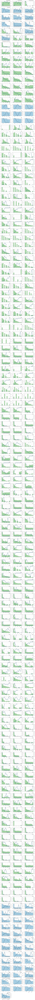

In [31]:
# Data Distribution Plot of all features
plot_fts(train.drop("isFraud", axis=1).columns)

## M1-M9
- Values are T F or NaN
- Column M4 appears to be different with values like M2 and M0

In [8]:
m_cols = [c for c in train if c[0] == 'M']
train[m_cols].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M2,F,T,NaN,NaN,NaN
1,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2,T,T,T,M0,F,F,F,F,F
3,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'TrainM9')

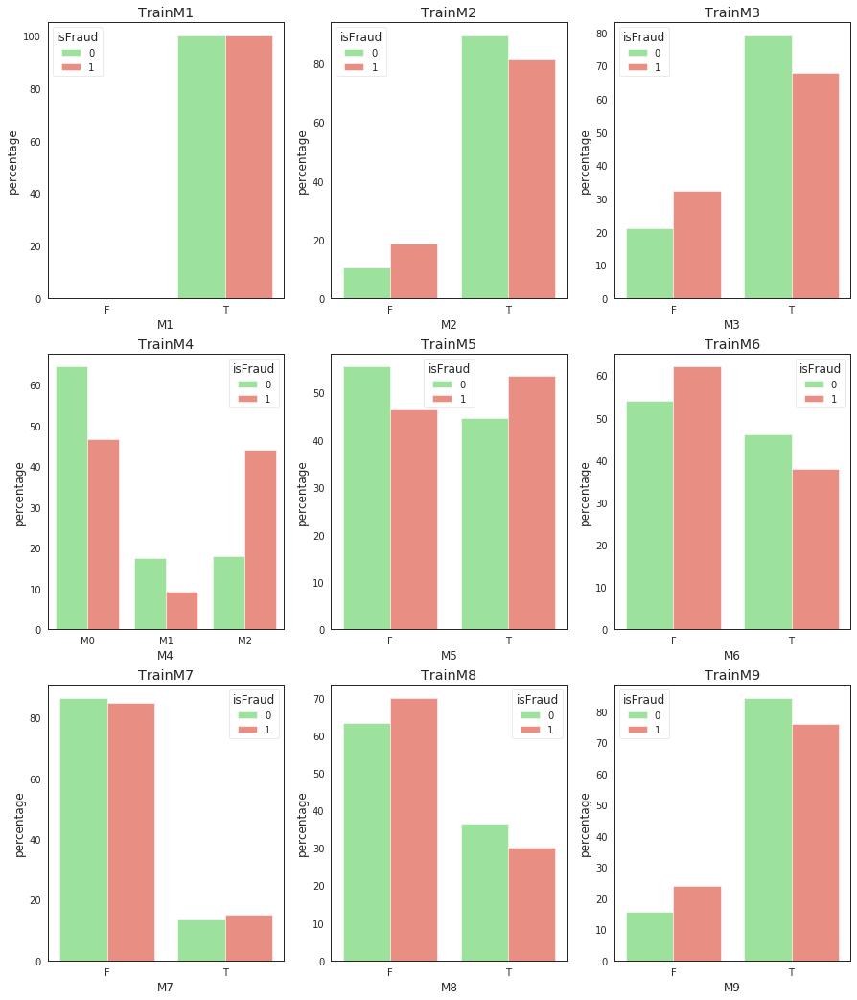

In [9]:
plt.figure(figsize=(15,18))
plt.subplot(3,3,1)
train_m1 = (train.groupby(['isFraud'])['M1']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M1'))
sns.barplot(x="M1", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m1)
plt.title('TrainM1')
plt.subplot(3,3,2)
train_m2 = (train.groupby(['isFraud'])['M2']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M2'))
sns.barplot(x="M2", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m2)
plt.title('TrainM2')
plt.subplot(3,3,3)
train_m3 = (train.groupby(['isFraud'])['M3']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M3'))
sns.barplot(x="M3", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m3)
plt.title('TrainM3')
plt.subplot(3,3,4)
train_m4 = (train.groupby(['isFraud'])['M4']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M4'))
sns.barplot(x="M4", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m4)
plt.title('TrainM4')
plt.subplot(3,3,5)
train_m5 = (train.groupby(['isFraud'])['M5']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M5'))
sns.barplot(x="M5", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m5)
plt.title('TrainM5')
plt.subplot(3,3,6)
train_m6 = (train.groupby(['isFraud'])['M6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M6'))
sns.barplot(x="M6", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m6)
plt.title('TrainM6')
plt.subplot(3,3,7)
train_m7 = (train.groupby(['isFraud'])['M7']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M7'))
sns.barplot(x="M7", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m7)
plt.title('TrainM7')
plt.subplot(3,3,8)
train_m8 = (train.groupby(['isFraud'])['M8']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M8'))
sns.barplot(x="M8", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m8)
plt.title('TrainM8')
plt.subplot(3,3,9)
train_m9 = (train.groupby(['isFraud'])['M9']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M9'))
sns.barplot(x="M9", y="percentage", hue="isFraud", palette=['#90EE90', '#FA8072'], data=train_m9)
plt.title('TrainM9')

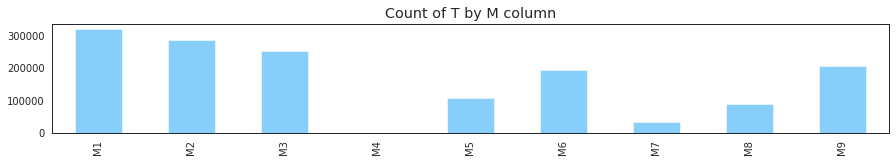

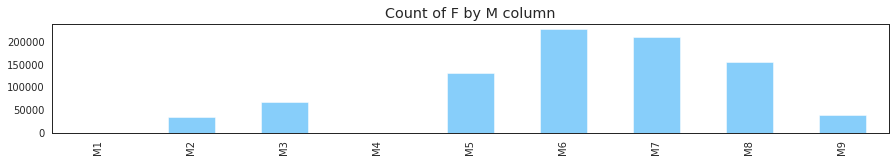

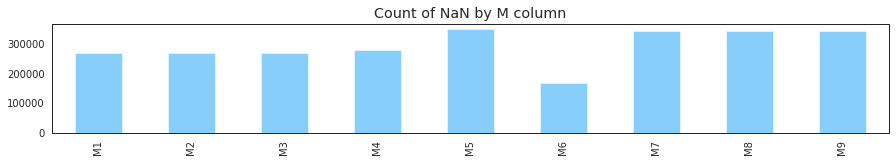

In [10]:
(train[m_cols] == 'T').sum().plot(kind='bar', color='#87CEFA', title='Count of T by M column', figsize=(15, 2))
plt.show()
(train[m_cols] == 'F').sum().plot(kind='bar', color='#87CEFA', title='Count of F by M column',figsize=(15, 2))
plt.show()
(train[m_cols].isna()).sum().plot(kind='bar', color='#87CEFA', title='Count of NaN by M column',figsize=(15, 2))
plt.show()

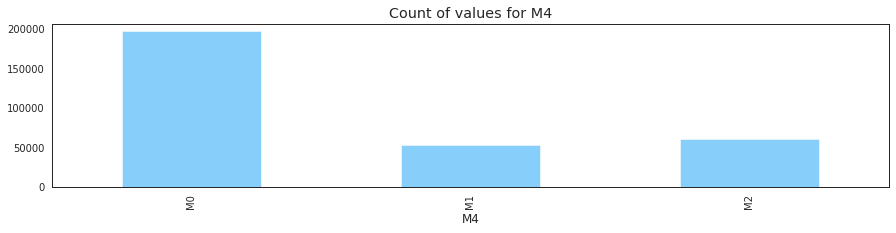

In [11]:
# Looking at M4 column since it is different than the others
train.groupby('M4')['TransactionID'].count().plot(kind='bar',
                                                  color='#87CEFA',
                                                  title='Count of values for M4',
                                                  figsize=(15, 3))
plt.show()

## C1-C14

In [0]:
c1descrp = describe(train,test,'C1')
c1descrp

,C1,Train,TrainFraud,TrainNoFraud,Test
0,count,590540,20663,569877,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,6,3,3
7,max,4684,4680,4684,2950
8,unique,1495,488,1386,1114
9,NaN,0,0,0,3


C1 of train data contains no NaN values but only 3 NaN values present in test data.

Text(0.5, 1.0, 'Test')

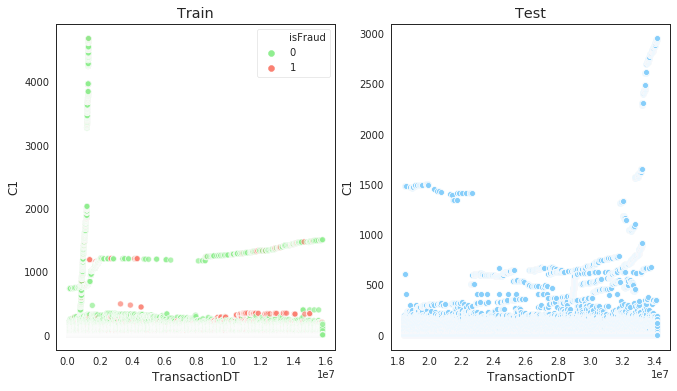

In [12]:
# Lets visualize this to detect some outliers.
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C1",hue="isFraud",palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C1", color='#87CEFA', data=test[~test['C1'].isnull()])
plt.title('Test')

Lets remove all the rows which have values >2000.

In [0]:
train = train[train['C1']<=2000]

In [0]:
c2descrp = describe(train,test,'C2')
c2descrp

,C2,Train,TrainFraud,TrainNoFraud,Test
0,count,590005,20603,569402,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,7,3,3
7,max,2524,2512,2524,3276
8,unique,1064,504,929,1095
9,NaN,0,0,0,3


C2 of train data contains no NaN values but only 3 NaN values present in test data.

Text(0.5, 1.0, 'Test')

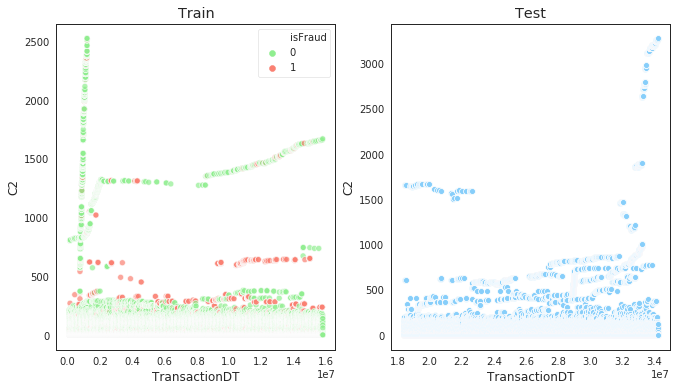

In [0]:
# Lets visualize this to detect some outliers.
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C2",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C2",color='#87CEFA', data=test[~test['C2'].isnull()])
plt.title('Test')

- Both train and test data have outliers.
- We can remove above 2000 points in C2.

In [0]:
train = train[train['C2']<=2000]

In [0]:
c3descrp = describe(train,test,'C3')
c3descrp

,C3,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,0.00566101,0.000243187,0.00585556,0.0273895
2,std,0.150635,0.0155945,0.15332,0.227661
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,0,0,0
7,max,26,1,26,31
8,unique,27,2,27,32
9,NaN,0,0,0,3


- 75% of values are 0 for both train and test.
- Train Fraud contains 2 values 0 and 1.
- Test contains 3 null values.
- So only based on C3 we can say that if value > 1 then it is non-fraud transaction.

Text(0.5, 1.0, 'Test')

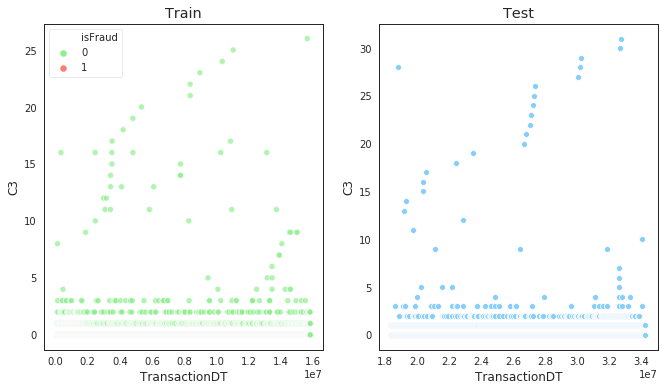

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C3",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C3",color='#87CEFA', data=test[~test['C3'].isnull()])
plt.title('Test')

In [0]:
c4descrp = describe(train,test,'C4')
c4descrp

,C4,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1107,1098,1107,1601
8,unique,751,149,707,729
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

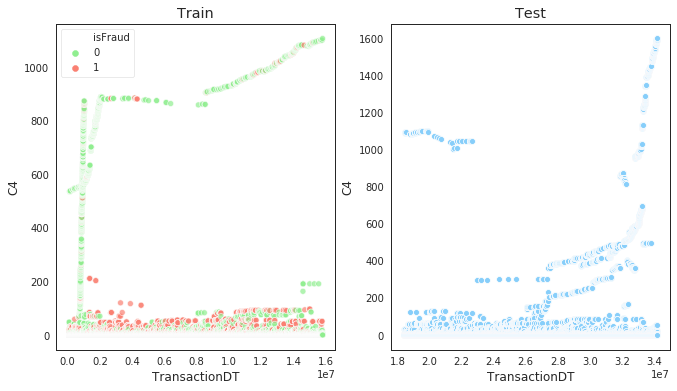

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C4",hue="isFraud",palette=['#90EE90', '#FA8072'],data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C4", color='#87CEFA', data=test[~test['C4'].isnull()])
plt.title('Test')

In [0]:
c5descrp = describe(train,test,'C5')
c5descrp

,C5,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,1.41406,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,1,0,1,1
7,max,349,331,349,376
8,unique,319,124,319,354
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

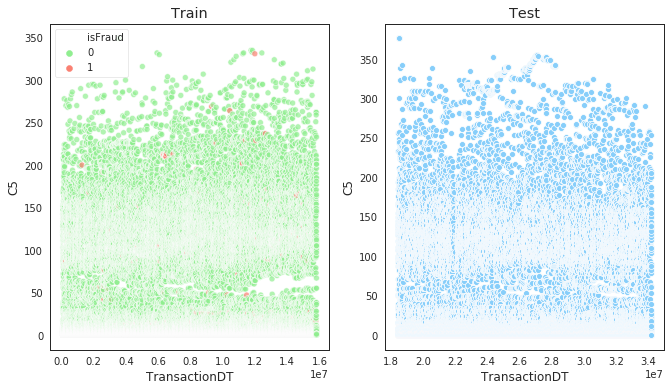

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C5",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C5",color='#87CEFA', data=test[~test['C5'].isnull()])
plt.title('Test')

- Spread across all over the region.
- No outliers found.

In [0]:
c6descrp = describe(train,test,'C6')
c6descrp

,C6,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,1,1,1
6,75%,2,3,2,2
7,max,1147,1138,1147,1601
8,unique,845,204,813,835
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

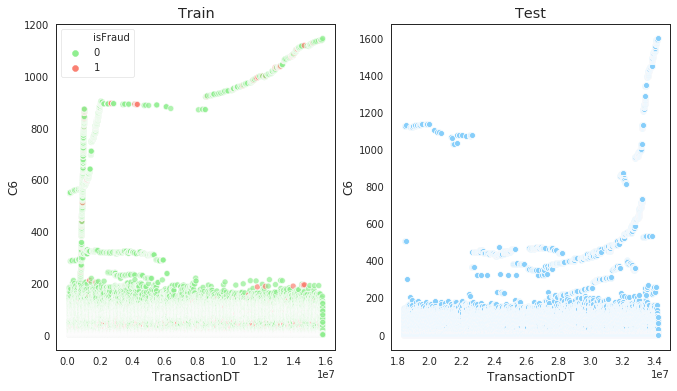

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C6",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C6", color='#87CEFA', data=test[~test['C6'].isnull()])
plt.title('Test')

Distribution is somewhat similar like C4.

In [0]:
c7descrp = describe(train,test,'C7')
c7descrp

,C7,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,1,0,0
7,max,875,873,875,1621
8,unique,503,117,465,519
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

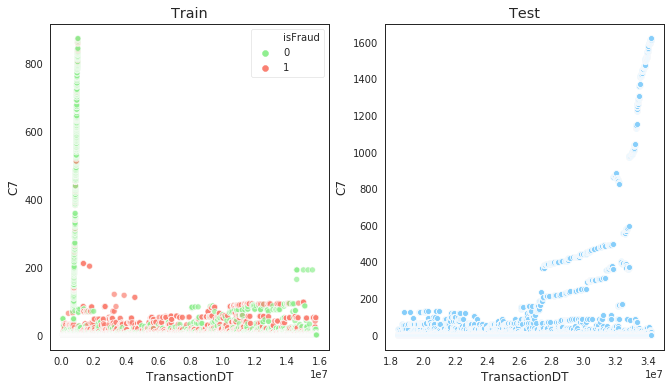

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C7",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C7", color='#87CEFA', data=test[~test['C7'].isnull()])
plt.title('Test')

In [0]:
c8descrp = describe(train,test,'C8')
c8descrp

,C8,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1306,1304,1306,1005
8,unique,678,235,583,443
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

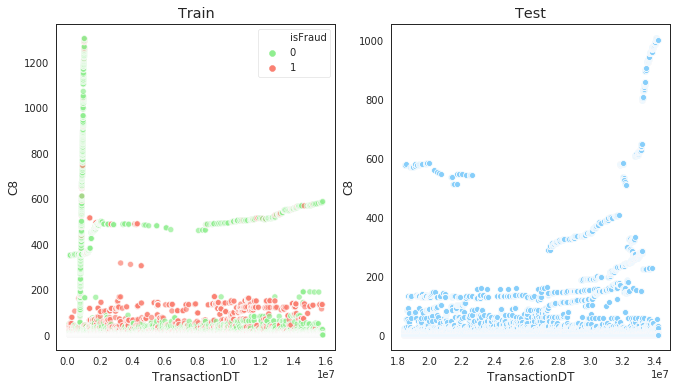

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C8",hue="isFraud", palette=['#90EE90', '#FA8072'],data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C8",color='#87CEFA', data=test[~test['C8'].isnull()])
plt.title('Test')

In [0]:
c9descrp = describe(train,test,'C9')
c9descrp

,C9,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,1.71191,NaN,NaN
2,std,0,8.47656,0,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,1,0,1,1
6,75%,2,1,2,2
7,max,210,192,210,572
8,unique,205,111,205,355
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

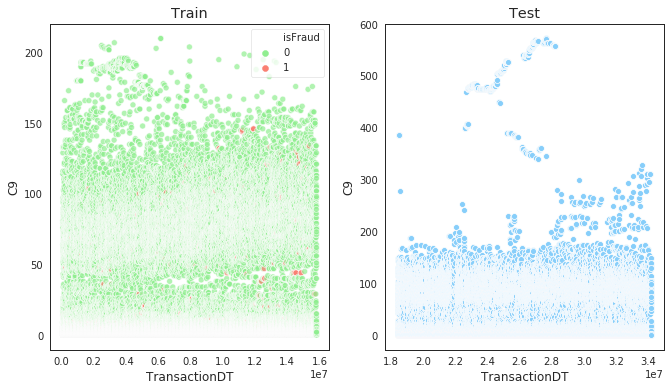

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C9",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C9",color='#87CEFA', data=test[~test['C9'].isnull()])
plt.title('Test')

In [0]:
c10descrp = describe(train,test,'C10')
c10descrp

,C10,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1464,1462,1464,881
8,unique,703,160,669,457
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

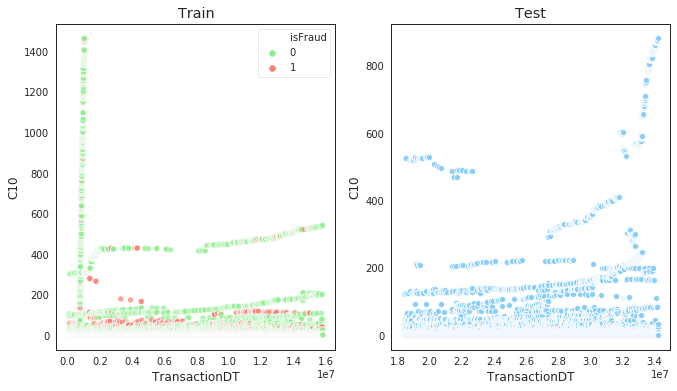

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C10",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C10", color='#87CEFA' , data=test[~test['C10'].isnull()])
plt.title('Test')

In [0]:
c11descrp = describe(train,test,'C11')
c11descrp

,C11,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,2,4,2,2
7,max,1210,1203,1210,2234
8,unique,879,250,851,911
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

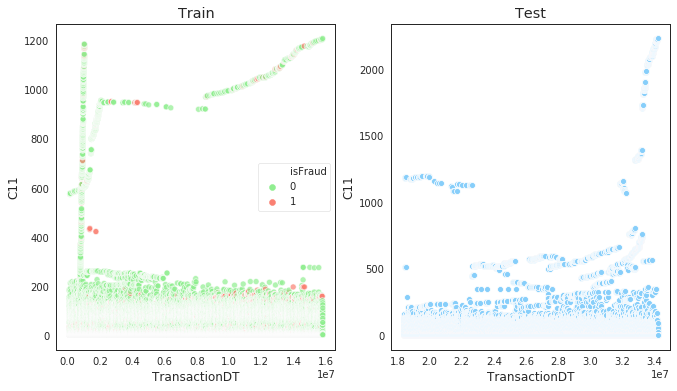

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C11",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C11",color='#87CEFA', data=test[~test['C11'].isnull()])
plt.title('Test')

In [0]:
c12descrp = describe(train,test,'C12')
c12descrp

,C12,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,2,0,1
7,max,1187,1185,1187,2234
8,unique,593,202,496,637
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

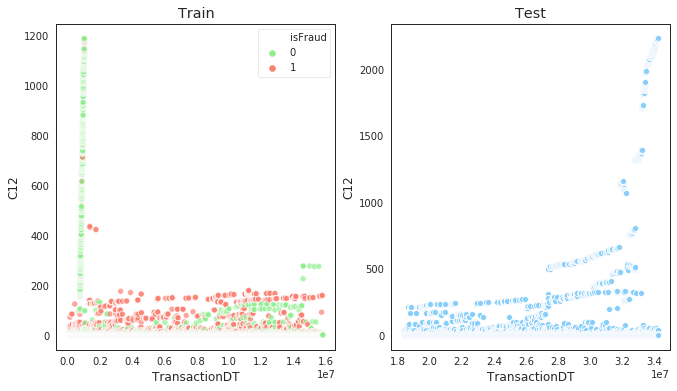

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C12",hue="isFraud", palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C12", color='#87CEFA', data=test[~test['C12'].isnull()])
plt.title('Test')

In [0]:
c13descrp = describe(train,test,'C13')
c13descrp

,C13,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,501943
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,3,1,3,3
6,75%,12,5,13,13
7,max,1285,1283,1285,1562
8,unique,1035,316,1032,1070
9,NaN,0,0,0,4748


Text(0.5, 1.0, 'Test')

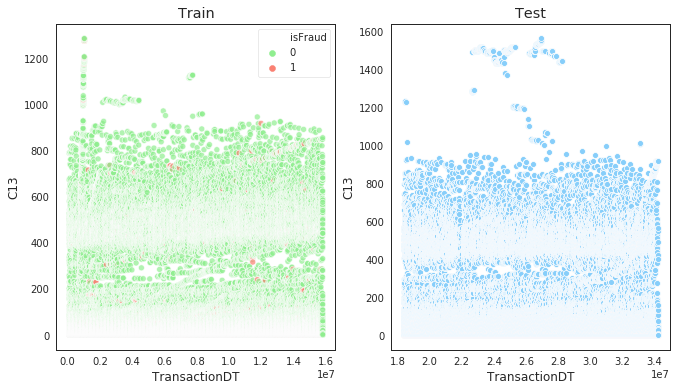

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C13",hue="isFraud",palette=['#90EE90', '#FA8072'], data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C13",color='#87CEFA', data=test[~test['C13'].isnull()])
plt.title('Test')

In [0]:
c14descrp = describe(train,test,'C14')
c14descrp

,C14,Train,TrainFraud,TrainNoFraud,Test
0,count,589722,20565,569157,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,0,1,1
5,50%,1,1,1,1
6,75%,2,2,2,2
7,max,798,792,798,797
8,unique,739,171,733,570
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

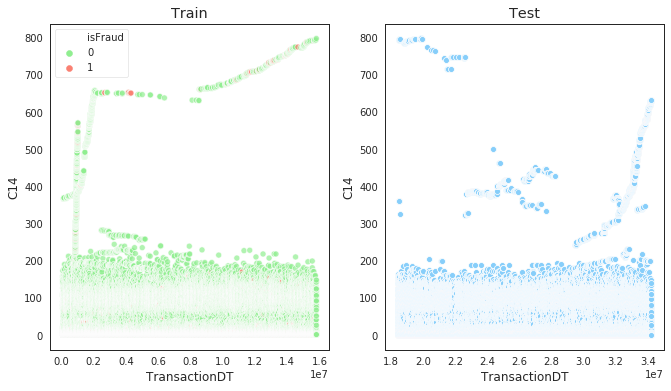

In [0]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C14",hue="isFraud",palette=['#90EE90', '#FA8072'],data=train,alpha=0.7,hue_order=[0,1])
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C14", color='#87CEFA', data=test[~test['C14'].isnull()])
plt.title('Test')

From the scatter plot it is confirm that many C values are coming from same distribution. Lets find the corelation between these C's columns and isFraud variable.

In [0]:
cor_c = train[['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14','isFraud']]

- We can nicely plot a correlation matrix. Since this is bound by -1 and 1,
- We use those as vmin and vmax. We may also remove leading zeros and hide
- The diagonal elements (which are all 1) by using a   `class: `matplotlib.ticker.FuncFormatter``.

We can see that some of the features are highly corelated with each other.

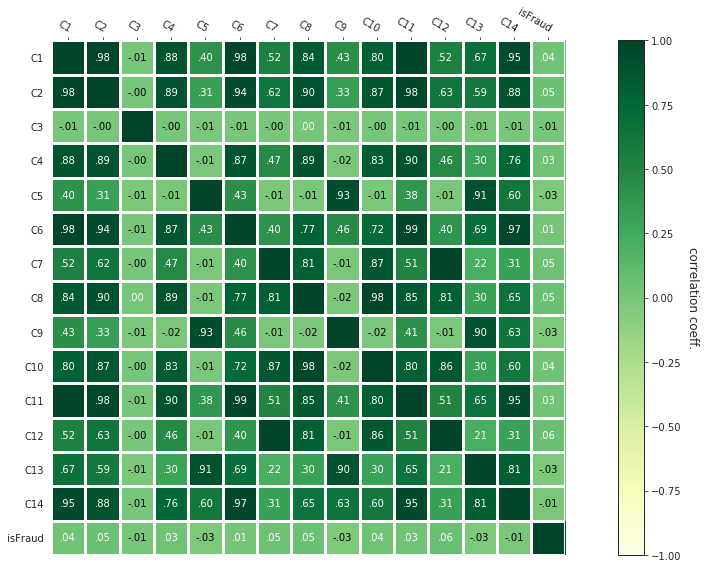

In [0]:
corr_matrix = cor_c.corr()
plt.figure(figsize=(15, 8))

im, _ = heatmap(corr_matrix, cor_c, cor_c, 
                cmap="YlGn", vmin=-1, vmax=1,
                cbarlabel="correlation coeff.")


def func(x, pos):
    return "{:.2f}".format(x).replace("0.", ".").replace("1.00", "")

annotate_heatmap(im, valfmt=matplotlib.ticker.FuncFormatter(func), size=10)


plt.tight_layout()
plt.show()

## D1-D15

Lets find the corelation between these **D** features with `'isFraud'` features

In [0]:
cor_d = train[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15','isFraud']]

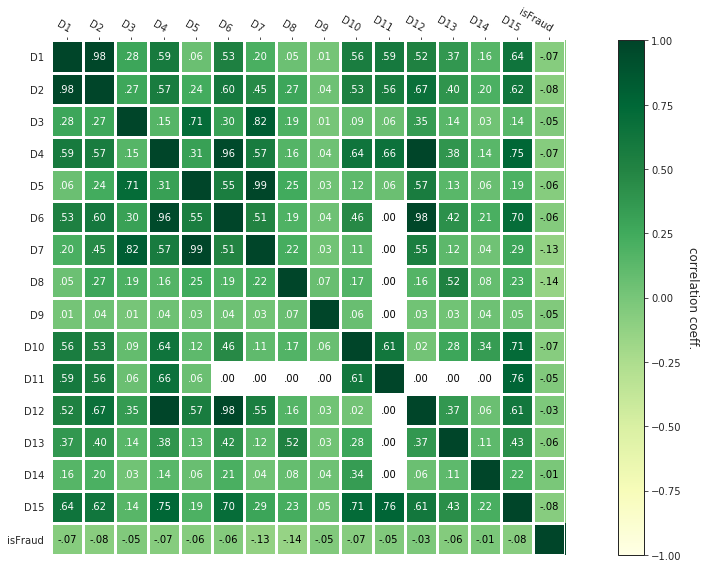

In [0]:
corr_matrix = cor_d.corr()
plt.figure(figsize=(15, 8))

im, _ = heatmap(corr_matrix, cor_d, cor_d, 
                cmap="YlGn", vmin=-1, vmax=1,
                cbarlabel="correlation coeff.")


def func(x, pos):
    return "{:.2f}".format(x).replace("0.", ".").replace("1.00", "")

annotate_heatmap(im, valfmt=matplotlib.ticker.FuncFormatter(func), size=10)


plt.tight_layout()
plt.show()

- Highly corelated D features are there like 'D4 and D12' and 'D6 and D12' and 'D5 and D7'.

In [0]:
d_features = list(train.columns[31:46])
train[d_features].head(10)

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
1,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
3,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
6,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
7,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
8,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,61.0,61.0,30.0,318.0,30.0,NaN,NaN,NaN,NaN,40.0,302.0,NaN,NaN,NaN,318.0


**D** features are mostly `NaNs`

In [0]:
# Click output to see the number of missing values in each column
missing_values_count = train[d_features].isnull().sum().sort_values(ascending=False)
missing_values_count

D7     551212
D13    528485
D14    528154
D12    525822
D6     517342
D9     515146
D8     515146
D5     309430
D2     280217
D11    278469
D3     262389
D4     168911
D15     89111
D10     75231
D1       1269
dtype: int64

In [0]:
# how many total missing values do we have?
total_cells = np.product(train[d_features].shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
(total_missing/total_cells) * 100

58.178079388819356

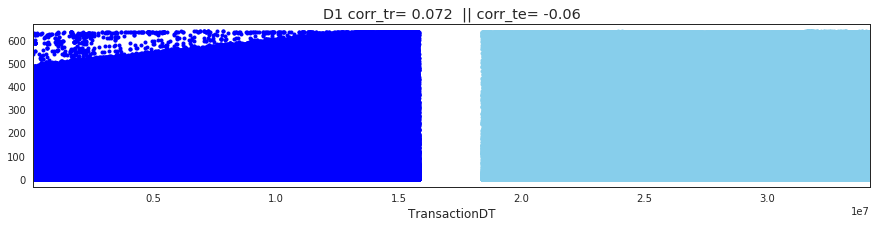

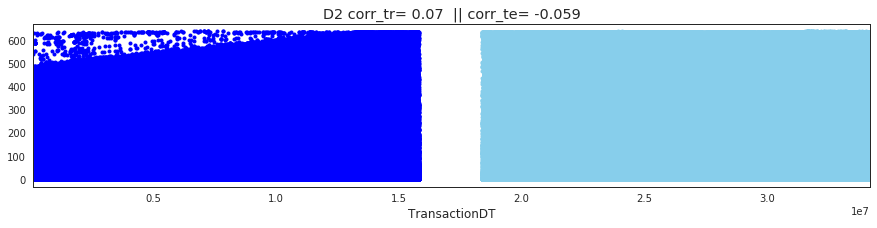

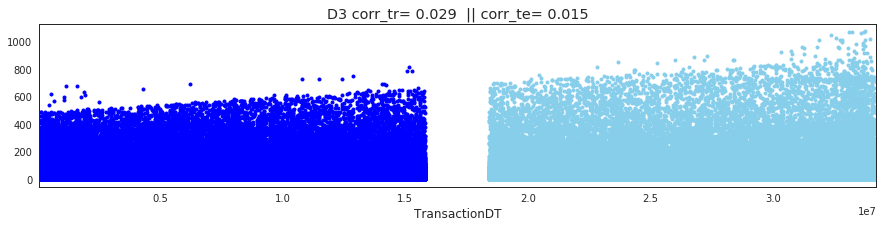

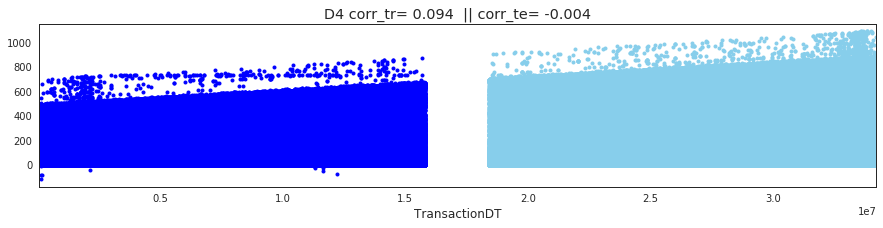

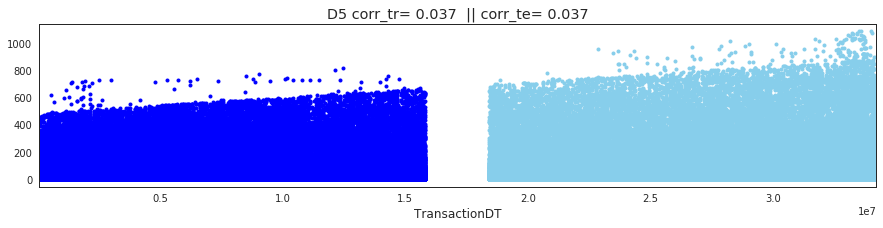

...

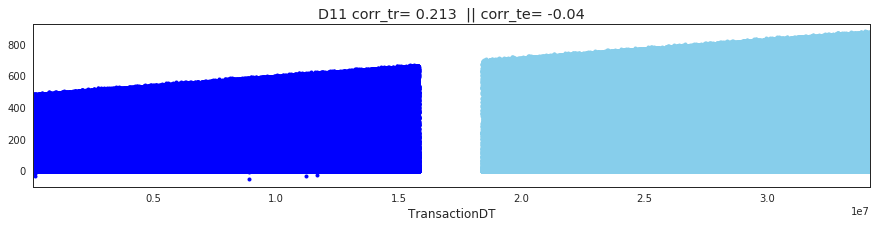

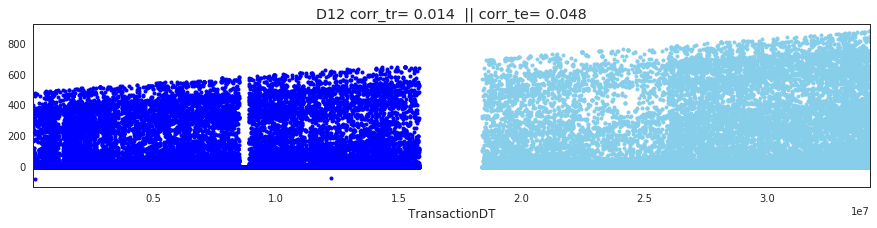

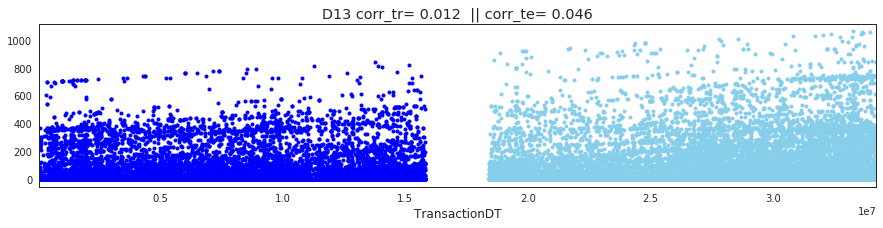

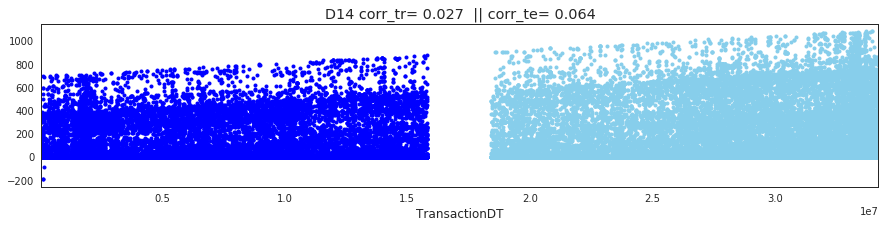

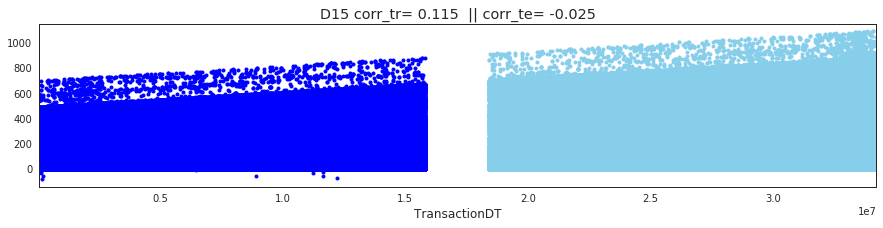

In [0]:
for i in d_features:
    cor_tr = np.corrcoef(train['TransactionDT'], train[i].fillna(-1))[0,1]
    cor_te = np.corrcoef(test['TransactionDT'], test[i].fillna(-1))[0,1]
    train.set_index('TransactionDT')[i].fillna(-1).plot(style='.', color='b', title=i+" corr_tr= "+str(round(cor_tr,3))+" || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    test.set_index('TransactionDT')[i].fillna(-1).plot(style='.', color='skyblue', title=i+" corr_tr= "+str(round(cor_tr,3))+"  || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    plt.show()

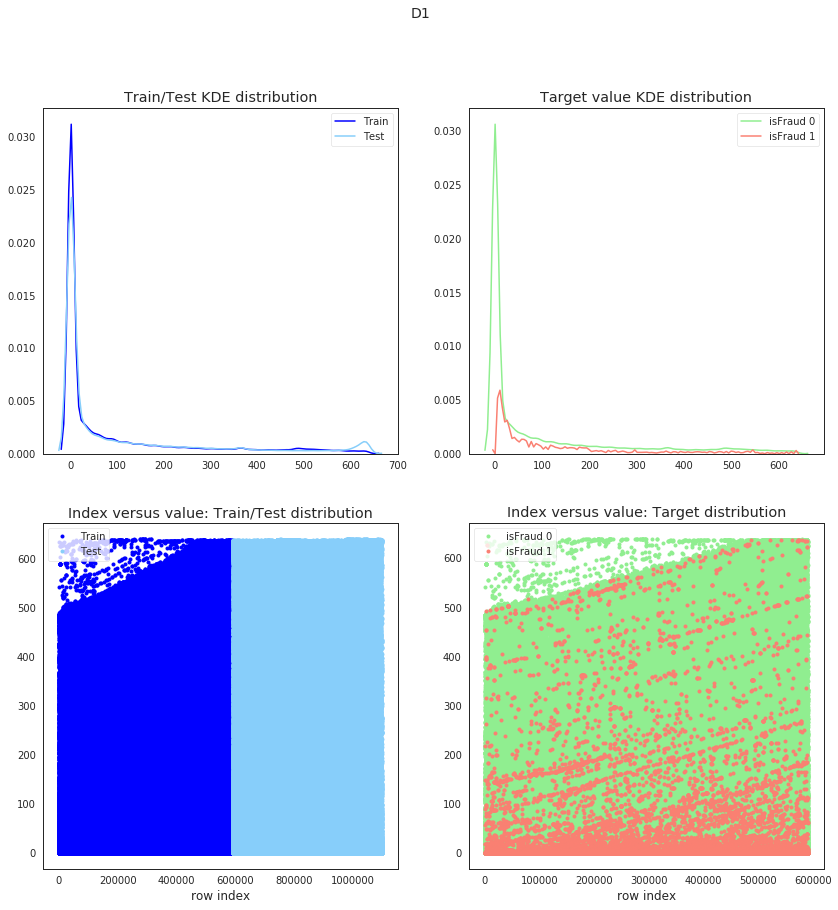

In [13]:
plot_numerical('D1')

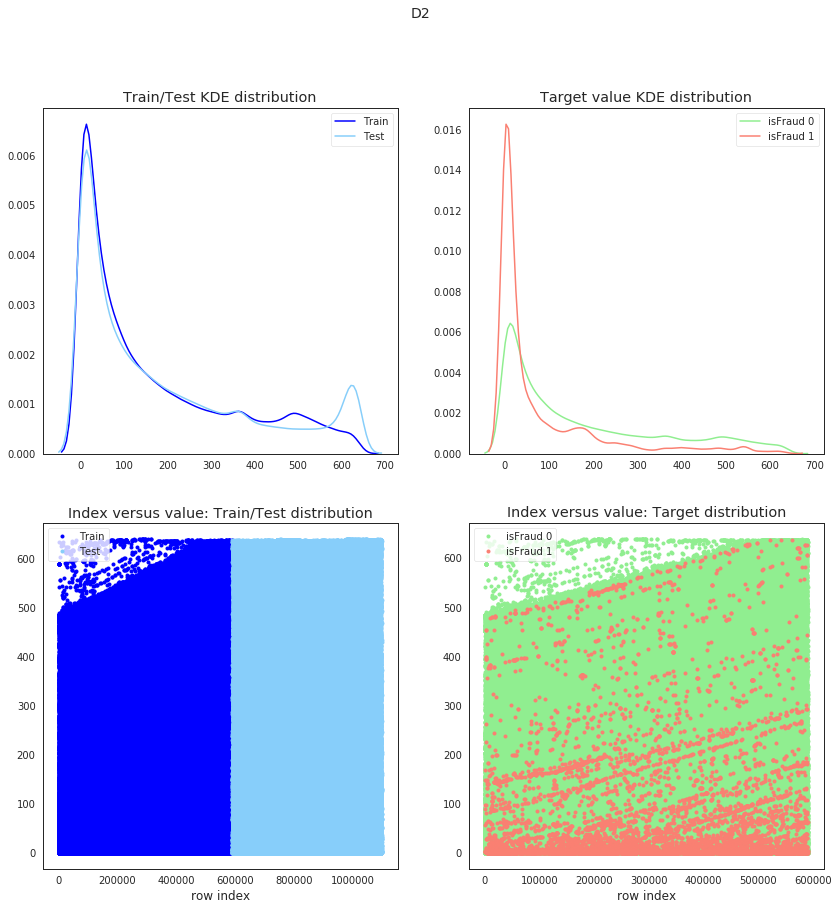

In [14]:
plot_numerical('D2')

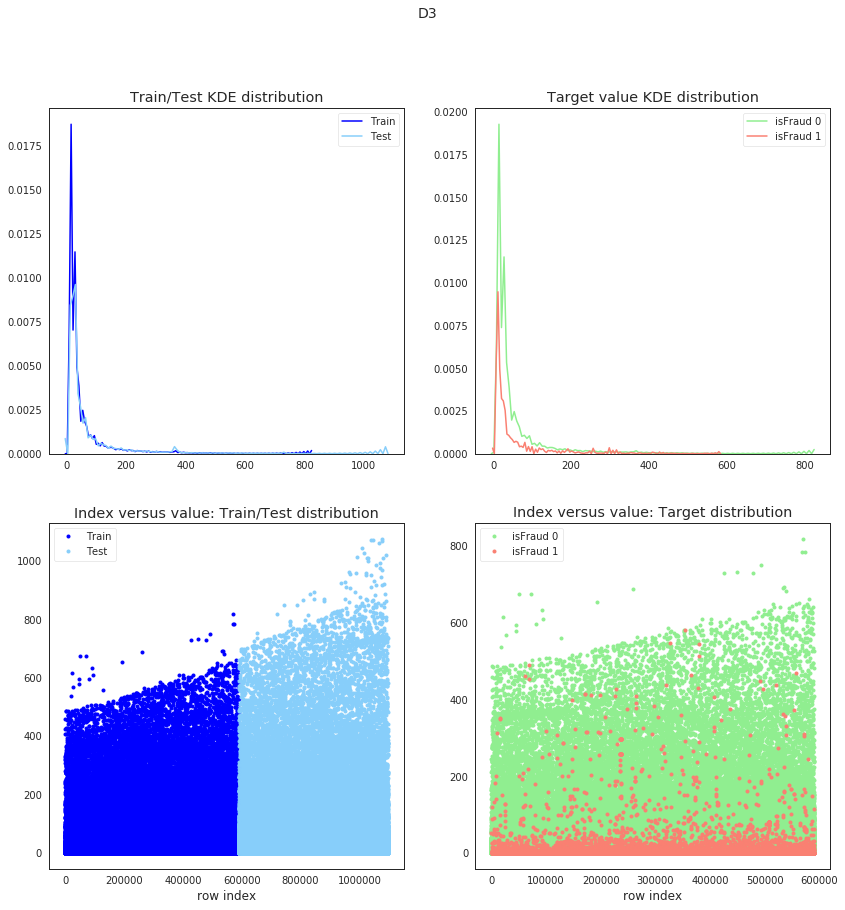

In [15]:
plot_numerical('D3')

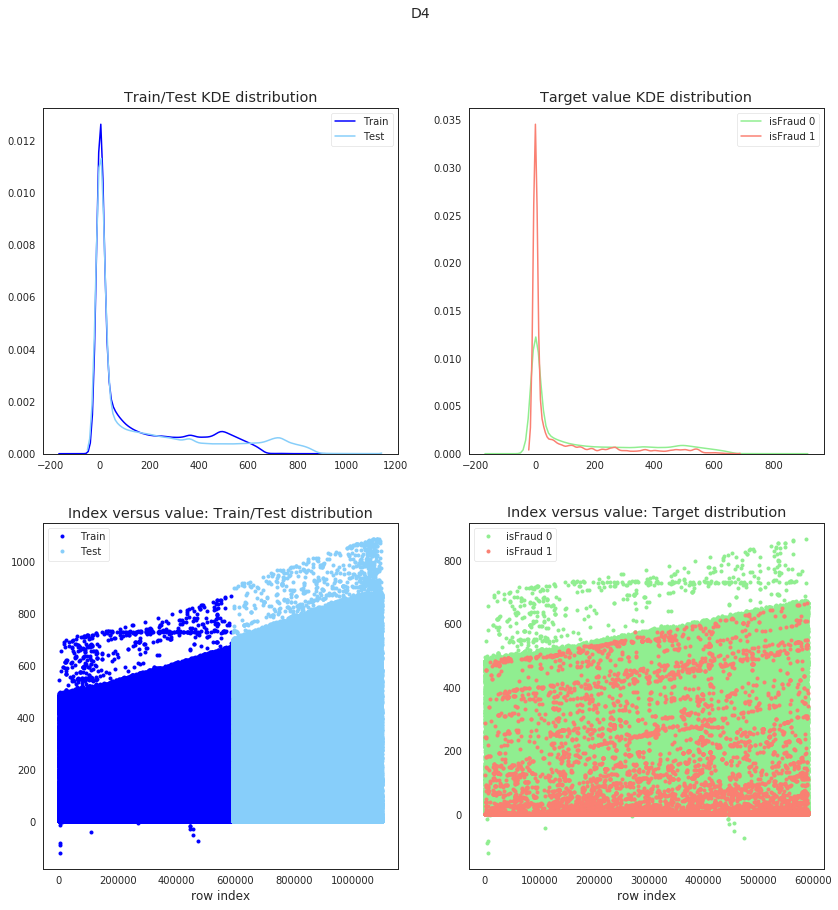

In [16]:
plot_numerical('D4')

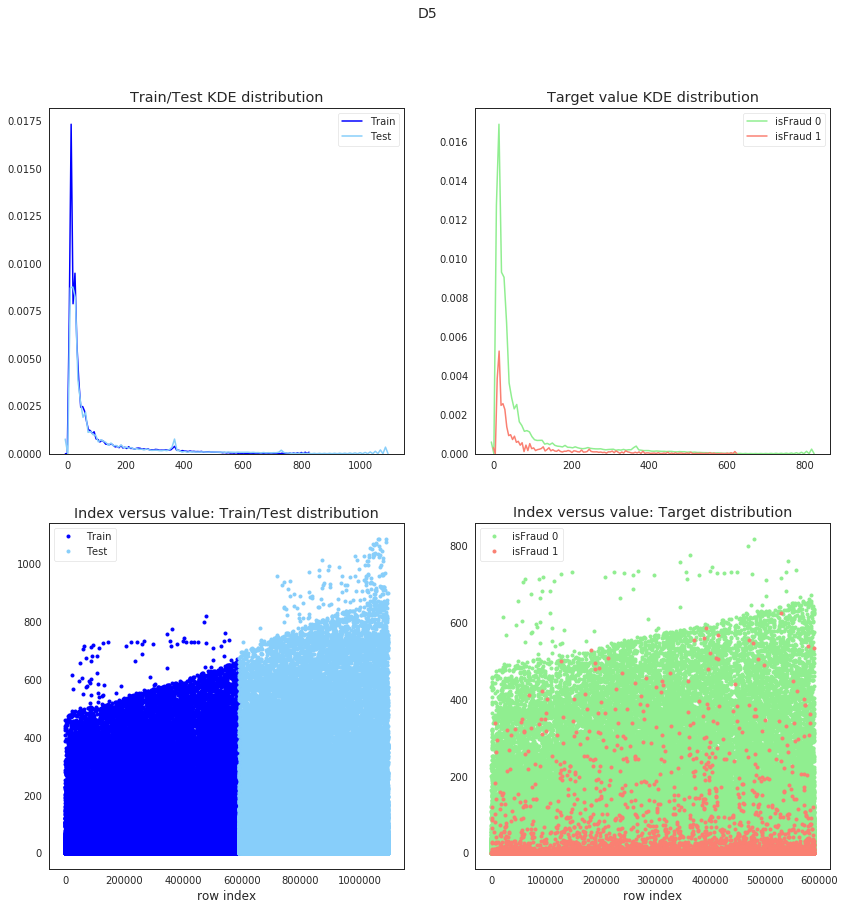

In [17]:
plot_numerical('D5')

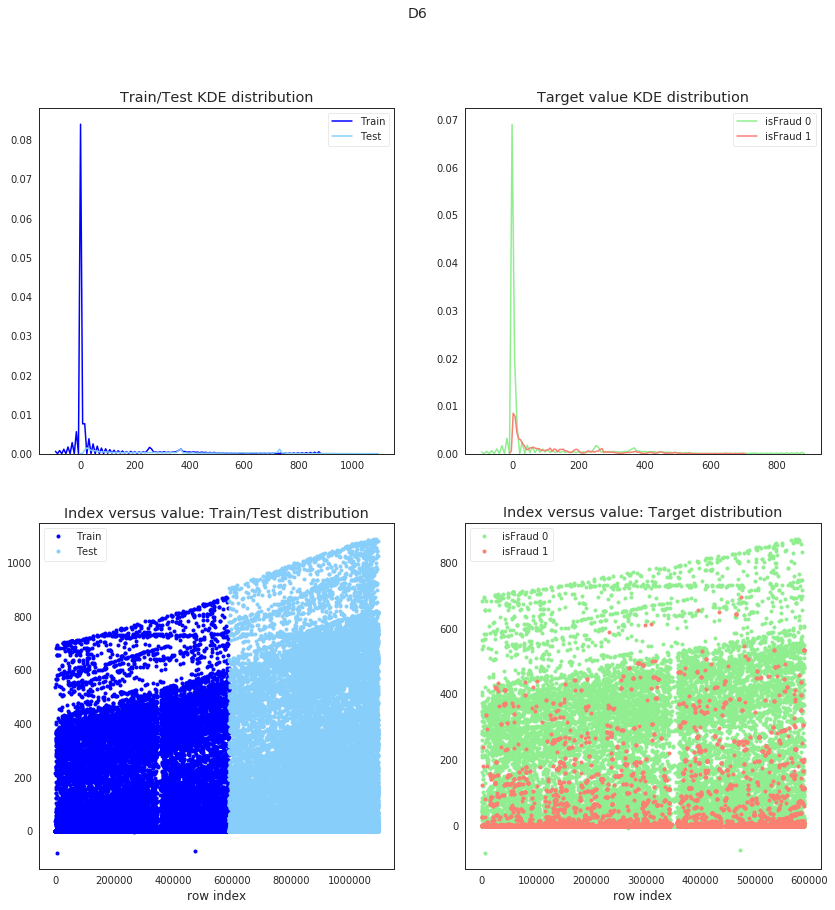

In [18]:
plot_numerical('D6')

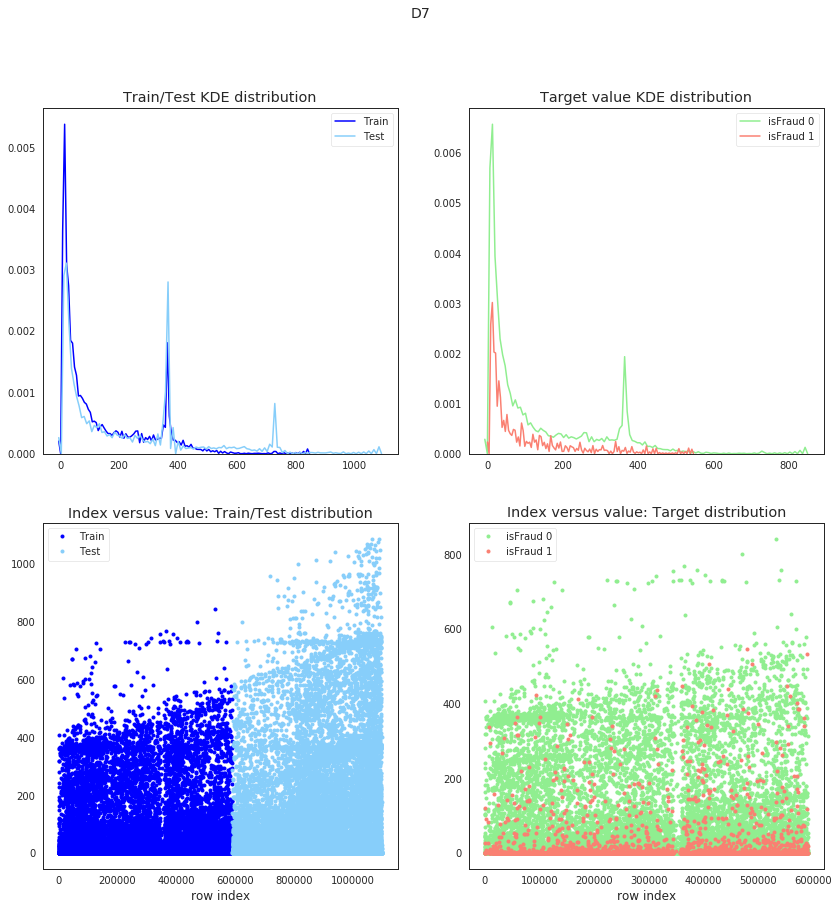

In [19]:
plot_numerical('D7')

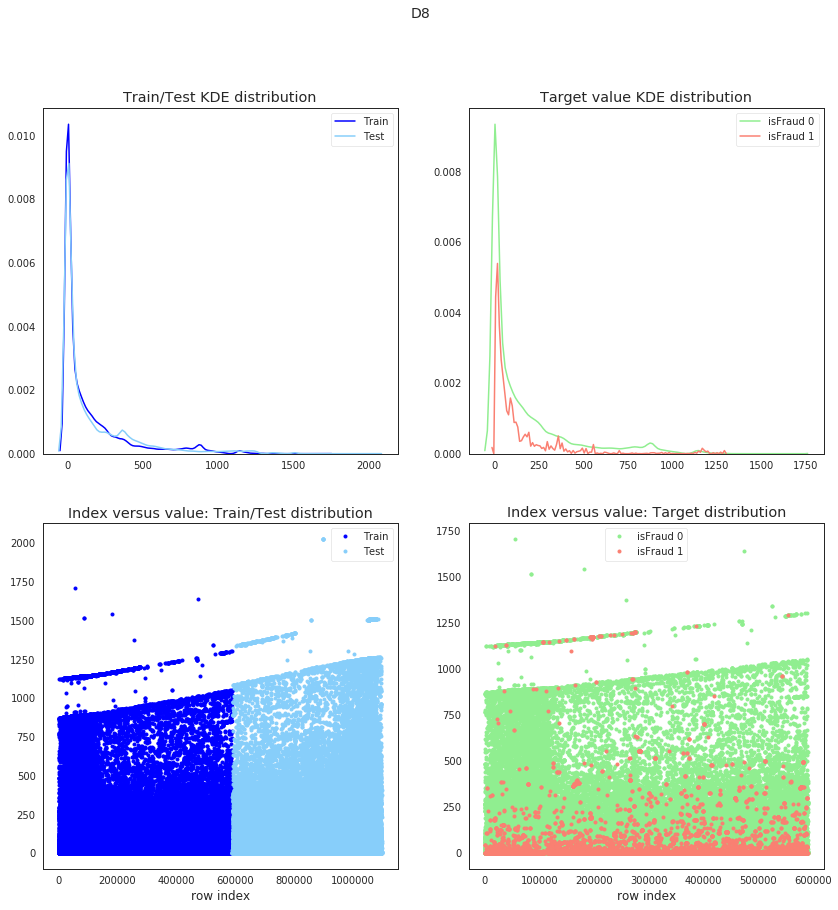

In [20]:
plot_numerical('D8')

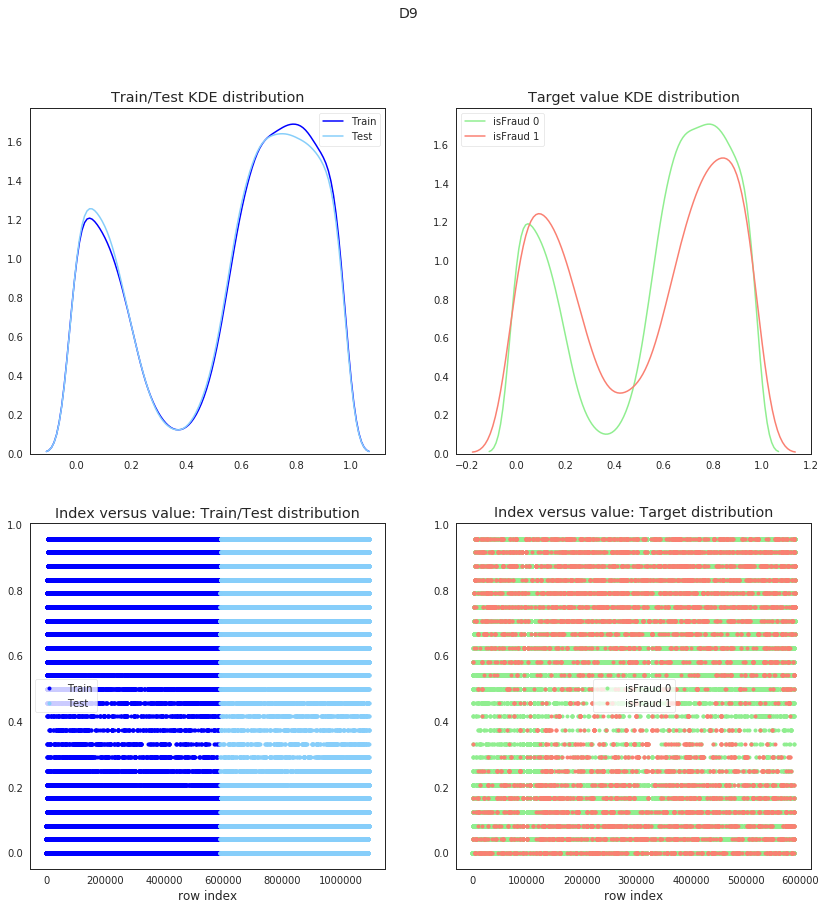

In [21]:
plot_numerical('D9')

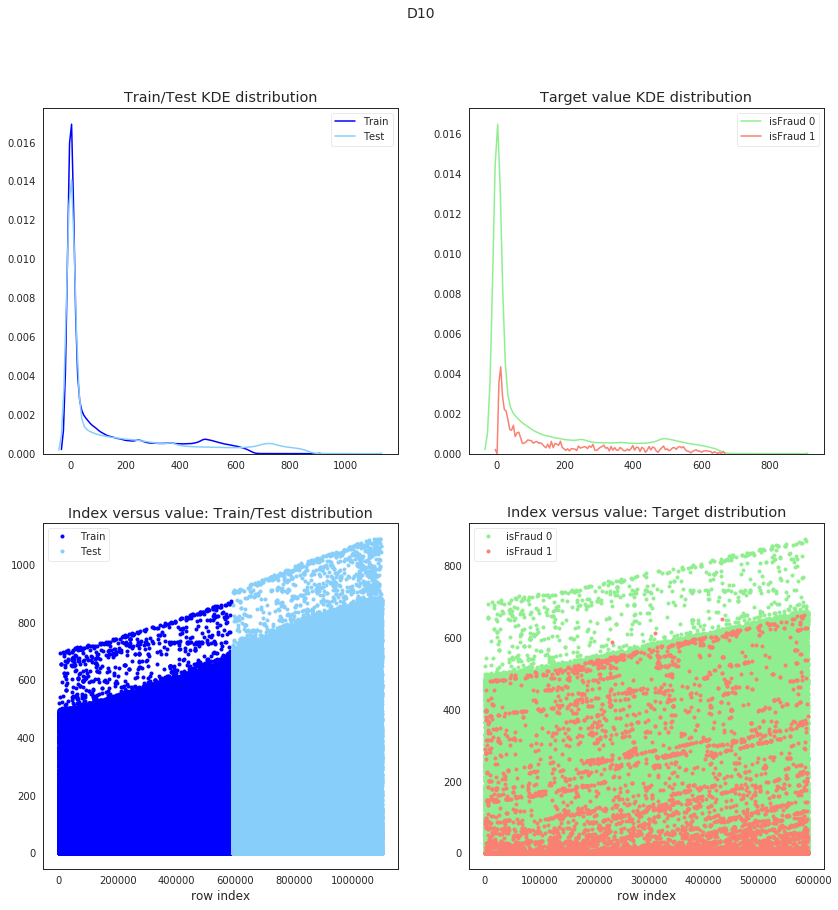

In [22]:
plot_numerical('D10')

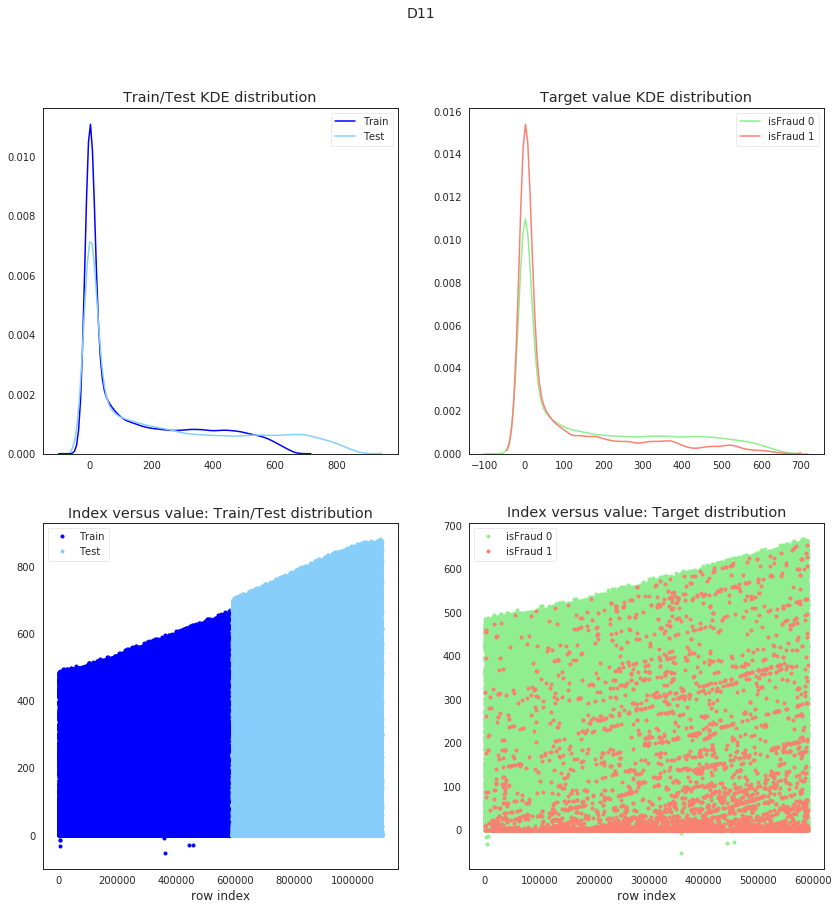

In [23]:
plot_numerical('D11')

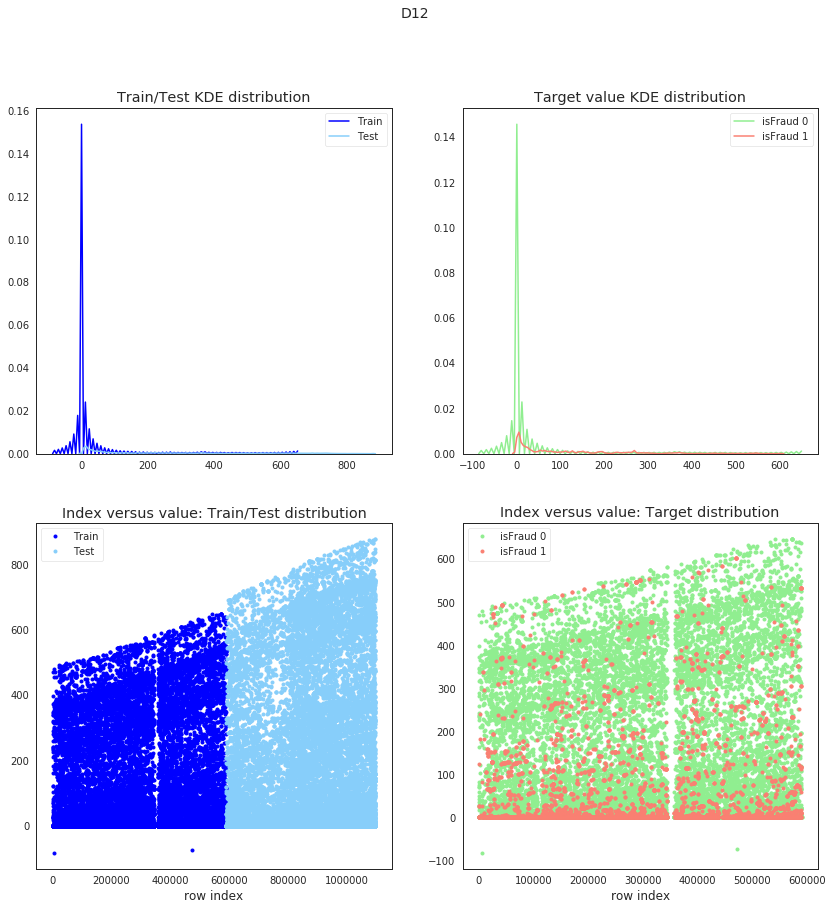

In [24]:
plot_numerical('D12')

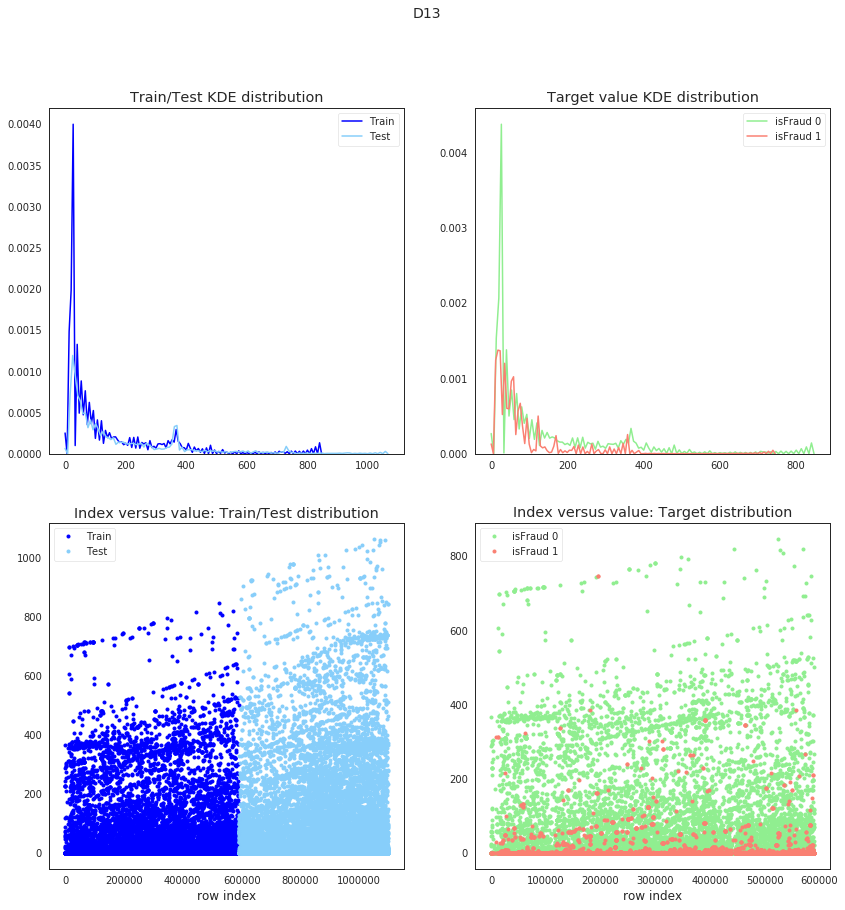

In [25]:
plot_numerical('D13')

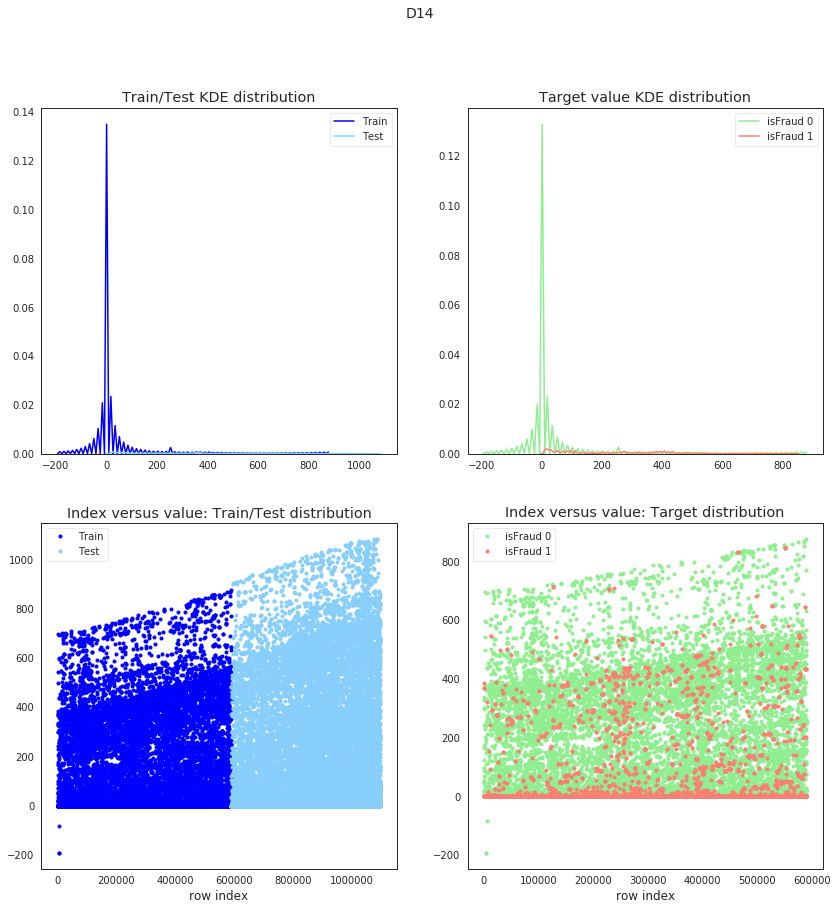

In [26]:
plot_numerical('D14')

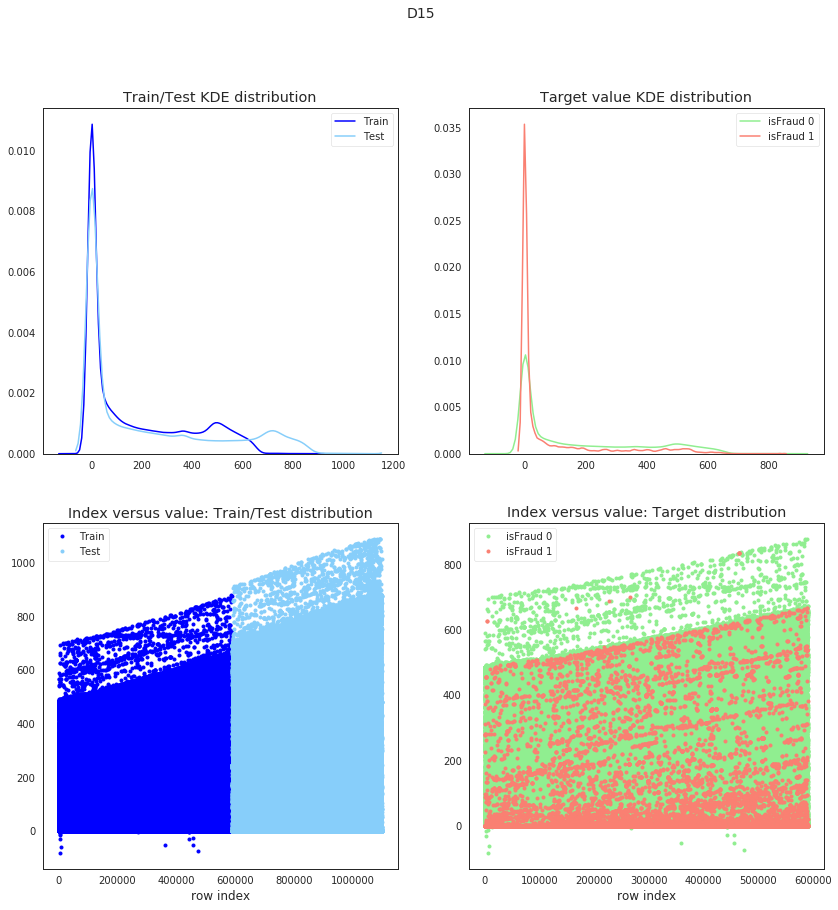

In [27]:
plot_numerical('D15')

## V1 - V339
Lots of 1s 0s and Nans, some larger values

In [0]:
v_cols = [c for c in train if c[0] == 'V']
train[v_cols].head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
train[v_cols].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,514440.0,514440.0,514440.0,514440.000000,514440.000000,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,514440.000000,514440.000000,514440.0,514440.0,514440.0,514440.0,514440.0,514440.0,420764.0,420764.0,420764.0,420764.0,420764.0,420764.0,...,588453.000000,588453.000000,589710.0,589710.0,589710.0,589710.0,589710.000000,589710.000000,589710.000000,589710.0,589710.0000,589710.0,589710.0,588453.0,588453.0,588453.0,589710.000000,589710.000000,589710.000000,589710.000000,589710.000000,589710.000000,82351.0,82351.0,82351.0,82351.000000,82351.0,82351.000000,82351.000000,82351.0,82351.000000,82351.000000,82351.000000,82351.000000,82351.0,82351.0,82351.0,82351.000000,82351.000000,82351.000000
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.122070,0.123169,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000776,0.000830,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.045502,0.052002,NaN,NaN,NaN,NaN,139.878098,408.658203,230.555649,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.924980,247.502289,162.240326,18.394291,42.101681,28.362041,NaN,NaN,NaN,0.058441,NaN,0.296631,0.336426,NaN,0.775391,721.741455,1375.778564,1014.619934,NaN,NaN,NaN,55.352417,151.160538,100.700874
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.332275,0.342041,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028595,0.031128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.289551,0.318115,0.0,0.0,0.0,0.0,2350.156738,4391.479004,3023.103760,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2271.511475,3979.458740,2794.577637,332.066010,473.454742,381.588470,NaN,NaN,NaN,0.304688,0.0,0.000000,0.000000,0.0,0.000000,6217.229980,11169.515625,7955.782227,NaN,NaN,NaN,668.375854,1095.057739,814.953247
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
25%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
50%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.000000,0.000000,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
75%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.000000,0.000000,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,1.0,0.000000,151.850006,36.005650,0.0,107.9375,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,25.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000

In [0]:
train['v_mean'] = train[v_cols].mean(axis=1)

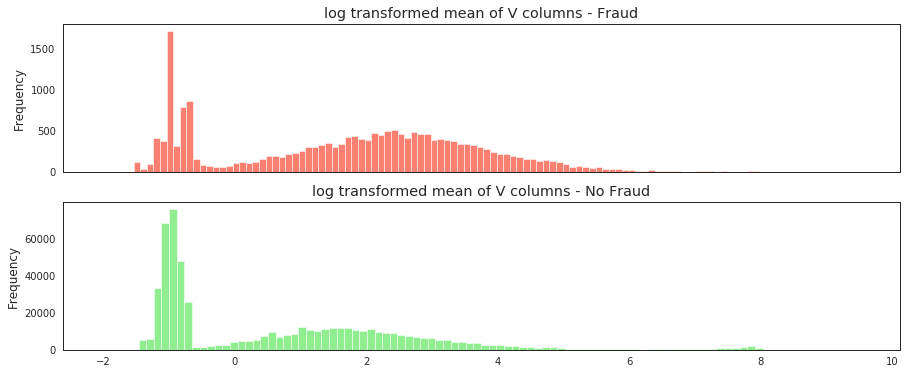

In [0]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(15, 6))
train.loc[train['isFraud'] == 1]['v_mean'].apply(np.log).plot(kind='hist',
                                                              bins=100,
                                                              title='log transformed mean of V columns - Fraud',
                                                              color='#FA8072',
                                                              ax=ax1)
train.loc[train['isFraud'] == 0]['v_mean'].apply(np.log).plot(kind='hist',
                                                              bins=100,
                                                              title='log transformed mean of V columns - No Fraud',
                                                              color='#90EE90',
                                                              ax=ax2)
plt.show()